In [518]:
import os
import pandas as pd
import datetime

%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

from make_df import make_df

SyntaxError: invalid syntax (<ipython-input-518-3d06647db33f>, line 10)

In [298]:
spring_start = "2004-03-01" 
spring_end = "2004-05-31"
summer_start = "2004-06-01" 
summer_end = "2004-08-31"
autumn_start = "2004-09-01" 
autumn_end = "2004-11-30"
winter_start = "2004-12-01" 
winter_end = "2004-02-28"

In [292]:
files= []
folder = "/Users/gianluca/Downloads/COMMERCIAL_LOAD_DATA_E_PLUS_OUTPUT.part1/USA_CA_Montague-Siskiyou.County.AP.725955_TMY3/"
for file in os.listdir(folder):
    files.append(file)

In [278]:
path = "/Users/gianluca/Downloads/COMMERCIAL_LOAD_DATA_E_PLUS_OUTPUT.part1/USA_CA_Montague-Siskiyou.County.AP.725955_TMY3/RefBldgFullServiceRestaurantNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv"
df = make_df(path)

In [367]:
start_date = "2004-01-01"
end_date = "2004-12-31"

workdays = pd.bdate_range(start_date,end_date)
all_days = pd.date_range(start_date,end_date)
weekends = all_days - workdays

/Users/gianluca/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: using '-' to provide set differences with datetimelike Indexes is deprecated, use .difference()


In [514]:
def plot_range(file_input, output_folder, start_date, end_date):
    df = make_df(folder + file_input)
    
    workdays = pd.bdate_range(start_date,end_date)
    all_days = pd.date_range(start_date,end_date)
    weekends = all_days - workdays
    
    for day in workdays:
        plt.subplot(131)
        plt.plot(df[str(day.date())].index.hour,
                 df[str(day.date())]['Electricity:Facility [kW](Hourly)'], color=(0,0,0,0.1))
    for day in all_days:
        plt.subplot(132)
        plt.plot(df[str(day.date())].index.hour,
                 df[str(day.date())]['Electricity:Facility [kW](Hourly)'], color=(0,0,0,0.1))
    plt.title(file_input, fontsize = 50)
    for day in weekends:
        plt.subplot(133)
        plt.plot(df[str(day.date())].index.hour,
                 df[str(day.date())]['Electricity:Facility [kW](Hourly)'], color=(0,0,0,0.1))
    plt.rcParams["figure.figsize"] = (50,8)

    if not os.path.exists(folder + output_folder):
        os.makedirs(folder + output_folder)
    
    plt.savefig(folder + output_folder + "/" + file_input.split(".")[0] + "_loads.png")
    return plt.show()

In [508]:
file

'RefBldgWarehouseNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv'

/Users/gianluca/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: using '-' to provide set differences with datetimelike Indexes is deprecated, use .difference()


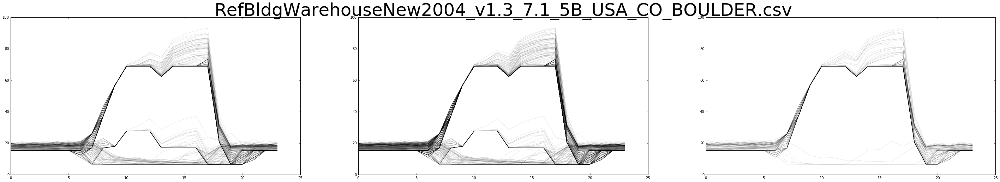

In [515]:
plot_range("RefBldgWarehouseNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv", "test_plots", "2004-01-01","2004-12-31")

In [391]:
def plot_day(df, days):
    for day in days:
        plt.plot(df[day].index.hour,
                         df[day]['Electricity:Facility [kW](Hourly)'])
    plt.show()

In [387]:
df = make_df(folder + "RefBldgPrimarySchoolNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv")

## NB:
Daylight Saving Time starts the 12 of March and ends the 5 of november

```df1 = pd.concat([df[:"2004-03-11"],
                 df["2004-03-12":"2004-11-5"].shift(1),
                 df["2004-11-6":]])
df1.fillna(method="bfill",inplace=True)```

/Users/gianluca/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: using '-' to provide set differences with datetimelike Indexes is deprecated, use .difference()


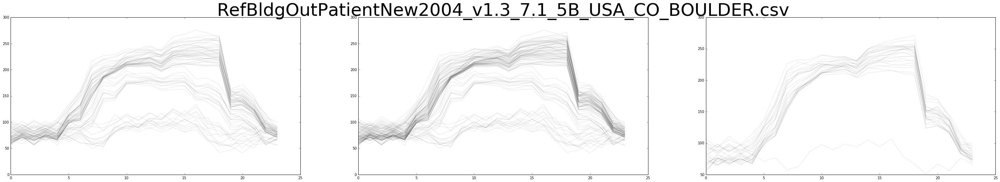

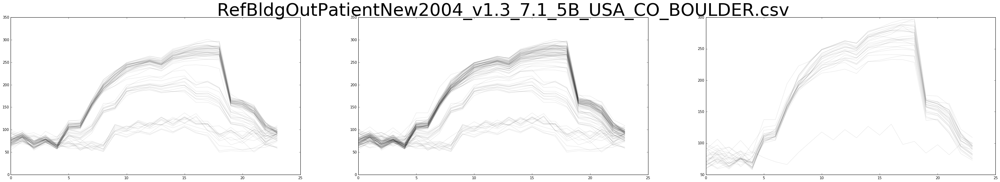

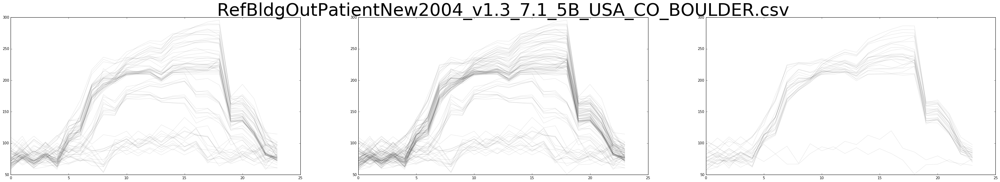

In [504]:
df = make_df(folder+"RefBldgOutPatientNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv")
plot_range("RefBldgOutPatientNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv", spring_start, spring_end)
plot_range("RefBldgOutPatientNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv", summer_start, summer_end)
plot_range("RefBldgOutPatientNew2004_v1.3_7.1_5B_USA_CO_BOULDER.csv", autumn_start, autumn_end)

/Users/gianluca/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:6: FutureWarning: using '-' to provide set differences with datetimelike Indexes is deprecated, use .difference()


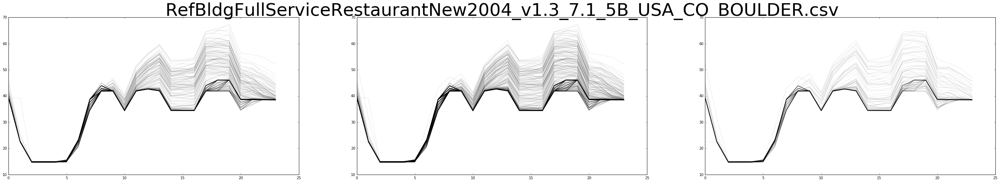

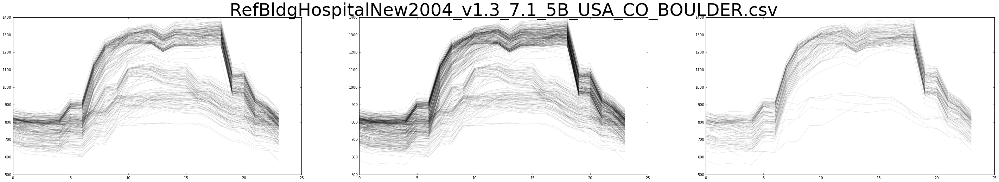

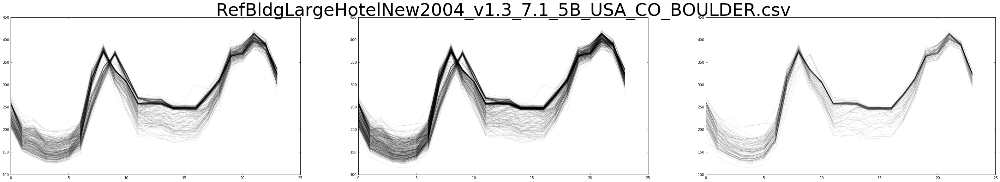

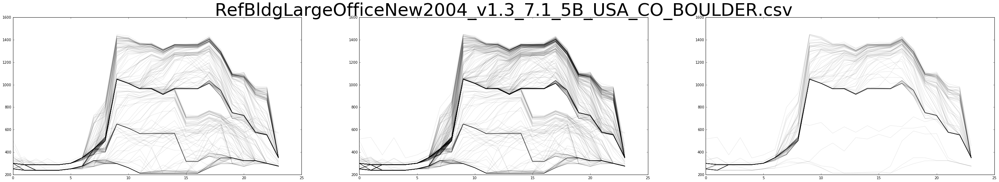

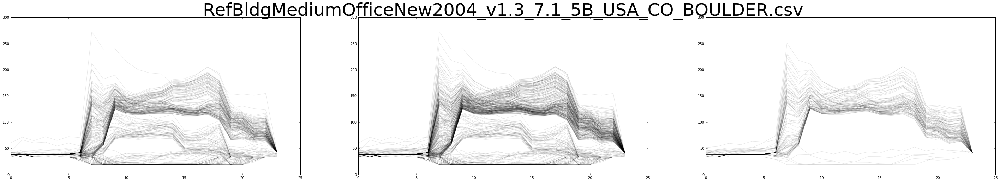

...

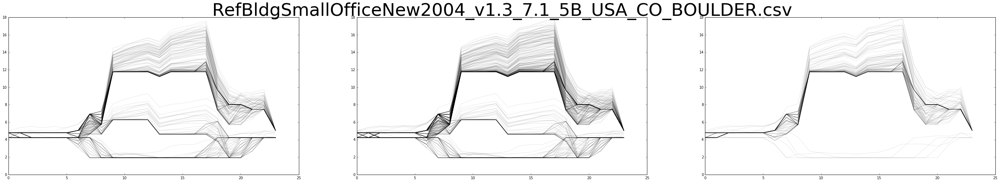

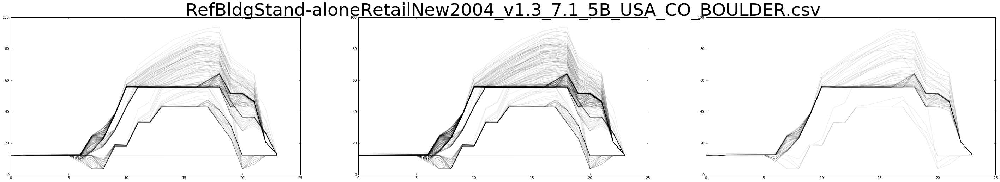

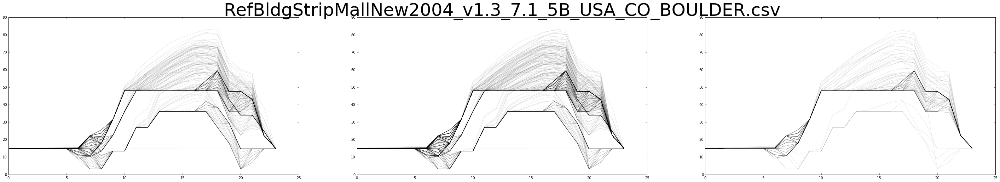

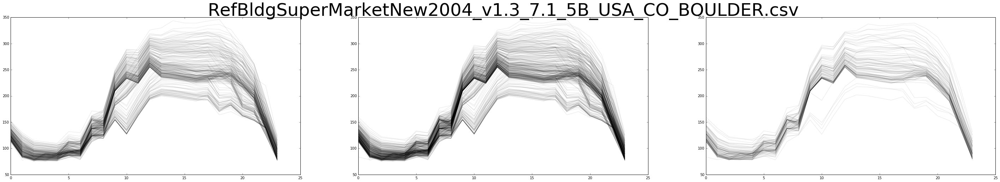

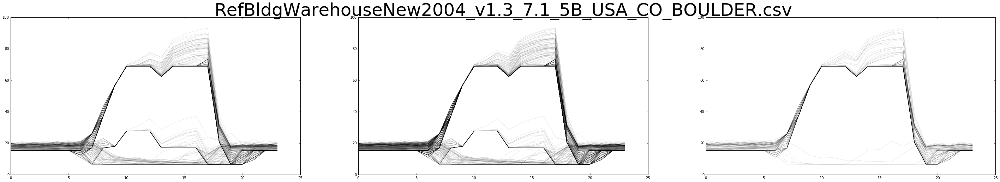

In [505]:
for file in files:
    plot_range(file,"2004-01-01","2004-12-31")

In [506]:
folder

'/Users/gianluca/Downloads/COMMERCIAL_LOAD_DATA_E_PLUS_OUTPUT.part1/USA_CA_Montague-Siskiyou.County.AP.725955_TMY3/'

To obtain the number of peaks we can normalize it to the mean to get something like a sinusoid, and then count the times it passes above or under it.
In this way we avoid counting all the small peaks that have no role

# Features:
* building kind!!! (school, office, house, etc)
* city code